In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
import geohash2
import matplotlib
from geopy.distance import great_circle
from geopy.distance import geodesic
from concurrent.futures import ThreadPoolExecutor

%matplotlib inline

In [3]:
df = pd.read_csv('Fake_Images.csv', encoding='ISO-8859-1')
df.head(2)

,image,Nameboard Image,Outlet Image,Remarks,Date,DistributorCode,DistributorName,SalesRep,repcode,OutletCode,OutletName,routename,RepName,RepId,Longitude,Latitude,IsGPSOn
0,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC007542,S.S. Stores,"Padukka Road, Kananwila,Wattekade up to Olabud...",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True
1,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC142580,The Dining House,"Horana Town, Wewala Up To Bellapitiya",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True


In [4]:
df.shape

(9829, 17)

In [5]:
df = df.drop_duplicates()

In [6]:
df.shape

(9703, 17)

In [7]:
df[(df['Longitude'] == 0.0) & (df['Latitude'] == 0.0)].head()

,image,Nameboard Image,Outlet Image,Remarks,Date,DistributorCode,DistributorName,SalesRep,repcode,OutletCode,OutletName,routename,RepName,RepId,Longitude,Latitude,IsGPSOn
67,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/2/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC105843,Manoj Cool Spot,"Horana Town, Wewala Up To Bellapitiya",Malaka Yakdehige 11660,DSR001405,0.0,0.0,True
105,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/2/2024,0000061822,Dilsha Distributors,Kadawatha Sajith (D) - 136207,61822KFPREP03,KF085519,KFP shop Sale Outlet,Kadawatha Road 1,Kadawatha Sajith (D) - 136207,61822KFPCSR03,0.0,0.0,True
114,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/2/2024,0000061822,Dilsha Distributors,Kadawatha Sajith (D) - 136207,61822KFPREP03,KF006089,Gamlath Stores,Kadawatha Road 1,Kadawatha Sajith (D) - 136207,61822KFPCSR03,0.0,0.0,True
148,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/2/2024,0000061822,Dilsha Distributors,Kadawatha Udayanga (D-SMMT) - 131921,61822KFPREP04,KF085517,KFP shop Sale Outlet,BATUWATHTHA,Kadawatha Udayanga (D-SMMT) - 131921,61822KFPCSR04,0.0,0.0,True
170,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/2/2024,0000061822,Dilsha Distributors,Kadawatha Sajith (D) - 136207,61822KFPREP03,KF006490,Kelani Grocery,MAHARA,Kadawatha Sajith (D) - 136207,61822KFPCSR03,0.0,0.0,True


In [8]:
df[df.isna().any(axis=1)]

,image,Nameboard Image,Outlet Image,Remarks,Date,DistributorCode,DistributorName,SalesRep,repcode,OutletCode,OutletName,routename,RepName,RepId,Longitude,Latitude,IsGPSOn
0,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC007542,S.S. Stores,"Padukka Road, Kananwila,Wattekade up to Olabud...",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True
1,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC142580,The Dining House,"Horana Town, Wewala Up To Bellapitiya",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True
2,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC157947,Rathna Stores-Horana,"Horana Town, Wewala Up To Bellapitiya",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True
3,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Kithulgodage Dharmasena new -Horana,R15,IC145926,ROHITHA STORES,"Ingiriya, Halwathura Up To Urugala",Kithulgodage Dharmasena new 11660,DSR001404,80.15024,6.73593,True
4,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000067217,Rovelta Distributors,H K L Chaturanga - Mundel (RD),R309,IC160828,Rasin stores,Norochcholai Ilanthadiya Alankuda,H K L Chaturanga 67217,DSR000433,79.82491,7.80562,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9824,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,NaN,NaN,8/31/2024,0000014611,Kalawila Stores,Chaminda Upul Kumara - Maha Ambalangoda,REP096,SD129497,beheth kade,meegama,Chaminda Upul Kumara 14611,DSR000563,80.02127,6.44750,True
9825,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,NaN,NaN,8/31/2024,0000070122,S.S.K. Distributors -Kadawatha,Jayanthan vinoth babu - Kadawatha,REP0774,SB315209,Inora pharmacy,Peliyagoda by route,Jayanthan vinoth babu 70122,DSR0001335,79.95821,7.02510,True
9826,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,NaN,NaN,8/31/2024,0000070122,S.S.K. Distributors -Kadawatha,Jayanthan vinoth babu - Kadawatha,REP0774,SB316389,sanju food,Peliyagoda by route,Jayanthan vinoth babu 70122,DSR0001335,79.95828,7.02506,True
9827,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,NaN,NaN,8/31/2024,0000070122,S.S.K. Distributors -Kadawatha,Jayanthan vinoth babu - Kadawatha,REP0774,SB317460,nandani stores,Peliyagoda by route,Jayanthan vinoth babu 70122,DSR0001335,79.95829,7.02497,True


In [9]:
df = df[~((df['Longitude'] == 0.0) & (df['Latitude'] == 0.0))]
df.reset_index(drop=True, inplace=True)

In [10]:
df.shape

(9352, 17)

In [11]:
def lat_lon_to_geohash(lat, lon, precision=4):
    return geohash2.encode(lat, lon, precision)

In [12]:
df['geohash'] = df.apply(lambda row: lat_lon_to_geohash(row['Latitude'], row['Longitude']), axis=1)

In [18]:
df.head(2)

,Date,DistributorCode,DistributorName,OutletCode,OutletName,routename,Longitude,Latitude,IsGPSOn,geohash
0,2024-09-26,57604,Sanjeeva Trading-Wattala,SD103807,Udaya St0res,DSR 2 57604 Route 4,79.86539,7.01005,1,tc0zc
1,2024-09-19,57604,Sanjeeva Trading-Wattala,SD103896,Rohitha stors,DSR 1 57604 Route 23,79.89751,7.02792,1,tc0zf


In [13]:
geohash_counts = df['geohash'].value_counts().reset_index()
geohash_counts.columns = ['geohash', 'count']

In [14]:
geohash_counts.shape

(78, 2)

In [15]:
threshold = 2  
# clusters = geohash_counts[geohash_counts['count'] > threshold]
clusters = geohash_counts

In [16]:
clusters['cluster_number'] = clusters.index + 1 

In [18]:
merged_df = df.merge(clusters[['geohash', 'cluster_number', 'count']], on='geohash', how='inner')

In [24]:
merged_df['cluster_number'].value_counts()

cluster_number
1       504
2       497
3       426
4       411
5       340
       ... 
1883      1
1884      1
1885      1
1886      1
1887      1
Name: count, Length: 1887, dtype: int64

In [19]:
merged_df.head(3)

,image,Nameboard Image,Outlet Image,Remarks,Date,DistributorCode,DistributorName,SalesRep,repcode,OutletCode,OutletName,routename,RepName,RepId,Longitude,Latitude,IsGPSOn,geohash,cluster_number,count
0,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC007542,S.S. Stores,"Padukka Road, Kananwila,Wattekade up to Olabud...",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True,tc0y,3,1655
1,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC142580,The Dining House,"Horana Town, Wewala Up To Bellapitiya",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True,tc0y,3,1655
2,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC157947,Rathna Stores-Horana,"Horana Town, Wewala Up To Bellapitiya",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True,tc0y,3,1655


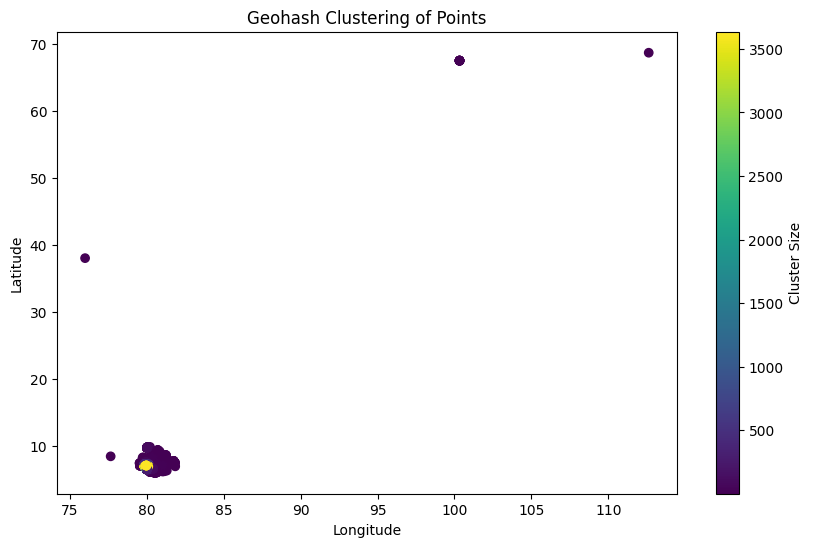

In [20]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(merged_df['Longitude'], merged_df['Latitude'], c=merged_df['count'], cmap='viridis', marker='o')
plt.colorbar(scatter, label='Cluster Size')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Geohash Clustering of Points')
plt.show()

In [21]:
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)


num_clusters = clusters['cluster_number'].max()
cmap = plt.get_cmap('Spectral', num_clusters) 
colors = [matplotlib.colors.rgb2hex(cmap(i)) for i in range(num_clusters)]


for _, row in merged_df.iterrows():
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=5,  
        color=colors[row['cluster_number'] - 1],  
        fill=True,
        fill_opacity=0.6,
        popup=f'Cluster: {row["cluster_number"]}, Count: {row["count"]}' 
    ).add_to(m)

m

In [22]:
merged_df[merged_df['cluster_number']==2].head(3)

,image,Nameboard Image,Outlet Image,Remarks,Date,DistributorCode,DistributorName,SalesRep,repcode,OutletCode,OutletName,routename,RepName,RepId,Longitude,Latitude,IsGPSOn,geohash,cluster_number,count
65,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000065211,Tech Computers,H W G Ruwan Jayampathi - Dematagoda,REP0233,SD305885,BMICH Sall -02,BMICH Book Fair 2020,H W G Ruwan Jayampathi 55252,DSR002190,79.91180,7.07136,True,tc2b,2,1864
66,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000025401,Iceman Cold Chain Services (Pvt) Ltd,Chamitha lakshan - Kandana (ICC),R501,IC160251,Barista Coffee Lanka (PVT) Ltd - Katubedda,Horeca-Mount Lavinia/Wed,Chamitha lakshan 25401,DSR0001226,79.90570,7.03891,True,tc2b,2,1864
68,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/2/2024,0000061822,Dilsha Distributors,Kiribathgoda Achila (D) - 129456,61822KFPREP01,KF084950,Gold Storse,Waragoda GT (D),Kiribathgoda Achila (D) - 129456,61822KFPCSR05,79.93087,7.06380,True,tc2b,2,1864


In [ ]:
def calculate_distance(point1, point2):
    return geodesic(point1, point2).meters

In [23]:
def calculate_close_points_for_cluster(cluster_points, distance_threshold):
    close_point_number = 1
    assigned_points = set()

    for i in range(len(cluster_points)):
        if pd.isna(cluster_points['close_point_group'].iloc[i]) and cluster_points.index[i] not in assigned_points:
            merged_df.loc[cluster_points.index[i], 'close_point_group'] = close_point_number

            assigned_points.add(cluster_points.index[i])

            point1 = (cluster_points.iloc[i]['Latitude'], cluster_points.iloc[i]['Longitude'])
            for j in range(i, len(cluster_points)):
                if j != i and pd.isna(cluster_points['close_point_group'].iloc[j]):
                    point2 = (cluster_points.iloc[j]['Latitude'], cluster_points.iloc[j]['Longitude'])
                    distance = calculate_distance(point1, point2).meters

                    if distance < distance_threshold:
                        merged_df.loc[cluster_points.index[j], 'close_point_group'] = close_point_number
                        assigned_points.add(cluster_points.index[j])

            close_point_number += 1

In [24]:
def assign_close_points(df, distance_threshold=50):
    df['close_point_group'] = np.nan  

    with ThreadPoolExecutor() as executor:
        futures = []
        for cluster_number in df['cluster_number'].unique():
            cluster_points = df[df['cluster_number'] == cluster_number]
            futures.append(executor.submit(calculate_close_points_for_cluster, cluster_points, distance_threshold))

        
        for future in futures:
            future.result() 

    return df

In [26]:
new_df = assign_close_points(merged_df)

In [27]:
new_df

,image,Nameboard Image,Outlet Image,Remarks,Date,DistributorCode,DistributorName,SalesRep,repcode,OutletCode,...,routename,RepName,RepId,Longitude,Latitude,IsGPSOn,geohash,cluster_number,count,close_point_group
0,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC007542,...,"Padukka Road, Kananwila,Wattekade up to Olabud...",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True,tc0y,3,1655,1.0
1,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC142580,...,"Horana Town, Wewala Up To Bellapitiya",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True,tc0y,3,1655,1.0
2,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Malaka Yakdehige- Horana,R16,IC157947,...,"Horana Town, Wewala Up To Bellapitiya",Malaka Yakdehige 11660,DSR001405,80.06525,6.71385,True,tc0y,3,1655,1.0
3,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000011660,Ananda Distributors,Kithulgodage Dharmasena new -Horana,R15,IC145926,...,"Ingiriya, Halwathura Up To Urugala",Kithulgodage Dharmasena new 11660,DSR001404,80.15024,6.73593,True,tc0y,3,1655,2.0
4,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,outlet image not acceptable,NaN,8/1/2024,0000067217,Rovelta Distributors,H K L Chaturanga - Mundel (RD),R309,IC160828,...,Norochcholai Ilanthadiya Alankuda,H K L Chaturanga 67217,DSR000433,79.82491,7.80562,True,tc2u,15,27,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9347,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,NaN,NaN,8/31/2024,0000014611,Kalawila Stores,Chaminda Upul Kumara - Maha Ambalangoda,REP096,SD129497,...,meegama,Chaminda Upul Kumara 14611,DSR000563,80.02127,6.44750,True,tc0u,6,294,105.0
9348,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,NaN,NaN,8/31/2024,0000070122,S.S.K. Distributors -Kadawatha,Jayanthan vinoth babu - Kadawatha,REP0774,SB315209,...,Peliyagoda by route,Jayanthan vinoth babu 70122,DSR0001335,79.95821,7.02510,True,tc0z,1,3635,39.0
9349,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,NaN,NaN,8/31/2024,0000070122,S.S.K. Distributors -Kadawatha,Jayanthan vinoth babu - Kadawatha,REP0774,SB316389,...,Peliyagoda by route,Jayanthan vinoth babu 70122,DSR0001335,79.95828,7.02506,True,tc0z,1,3635,39.0
9350,https://surge.keells.lk/Myfiles/RetailerImages...,Fake Image,NaN,NaN,8/31/2024,0000070122,S.S.K. Distributors -Kadawatha,Jayanthan vinoth babu - Kadawatha,REP0774,SB317460,...,Peliyagoda by route,Jayanthan vinoth babu 70122,DSR0001335,79.95829,7.02497,True,tc0z,1,3635,39.0
